# Alexander Shumilov, IST, 2019

# Problem Set 1 (92 points) 

## Important information
We provide signatures of the functions that you have to implement. Make sure you follow the signatures defined, otherwise your coding solutions will not be graded.

# Problem 1 (Time series forecasting with simple NLA) (31 pts)

Many daily-life events can be described using **time series**: $x_t$, $t \in \{0, \ldots, n\}$, e.g.
closing price of a stock on day $t$ or number of users on a website in hour $t$.

Below you are given time series example $x \in \mathbb{R}^n$:

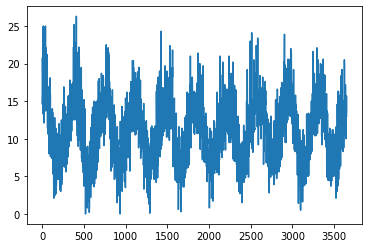

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

data = pd.read_csv('./data.csv')
x = data['Val'].values
plt.plot(x)

Raw time dependent data usually looks rather unpretty. However, it can be often considered as a sum of some **trend** + some random **noise**. For example, a periodic trend is easily observed in the series above.

_1._ Your first task is to find **truly** periodic series which will best approximate the original data $x$.

Let $z \in \mathbb{R}^m$ denotes one period of some given periodic data $x_{per} \in \mathbb{R}^n$ (assuming $n$ is miltiple of $m$), i.e.:

$$x_{per} = (z,z,\ldots,z),$$

or in the matrix form:

$$Az = x_{per},$$

with "tall" matrix $A \in \mathbb{R}^{n\times m}$, $n > m$.

The actual data $x$ is non-periodic, hence the solution (in appropriate sense) of the following **overdetermined** linear system is required (think why):

$$Az = x.$$

- (3 pts) Choose $m$ and implement function to construct matrix $A$ according to the template below. What structure does this matrix have?
 *Hint:*  you can use ```numpy.vstack()``` function. Describe how do you choose $m$. Also, suggest what are the data you are working with?

I chose $m: n = k*m, k \in N$, for example  suitable m are 730, 365, ... , 25, 5. Our data may be just a some sort of periodic radio signal. Also during "Intro to DS course" we were introduced to such kind of time series, indicating, for example, year temperature (1 period - 1 year) or .

In [74]:
def build_A(n, m):
    '''
    Input: positive integers n, m
    Output: np.array of size (n, m)
    '''
    # Pure loops are strongly prohibited! 
    # Comprehension expressions are possible. 
    return np.vstack(tuple([np.eye(m)]*int(n/m)))
    raise NotImplementedError()
m = 365
A = build_A(x.shape[0], m) 

In [75]:
A.shape

(3650, 365)

- (3 pts) Find the best periodic approximation $z^*$ as the solution of the above overdetermined linear system. Below you are supposed to compute **pseudo-inverse** of $A$ (by definition) according to the provided template.

$A^{\dagger} = (A^*A)^{-1}A^* $ by definition.

In [76]:
def build_pseudoinverse(A):
    '''
    Input: np.array of size (n, m)
    Output: np.array of size (m, n)
    '''
    return np.dot(np.linalg.inv(np.dot(np.transpose(A),A)), np.transpose(A))
    raise NotImplementedError()

A_inv = build_pseudoinverse(A)
z = A_inv @ x

- (1 pts) Plot the original data $x$ and the periodic data $Az^*$ in one plot. Do not forget to add a proper legend!

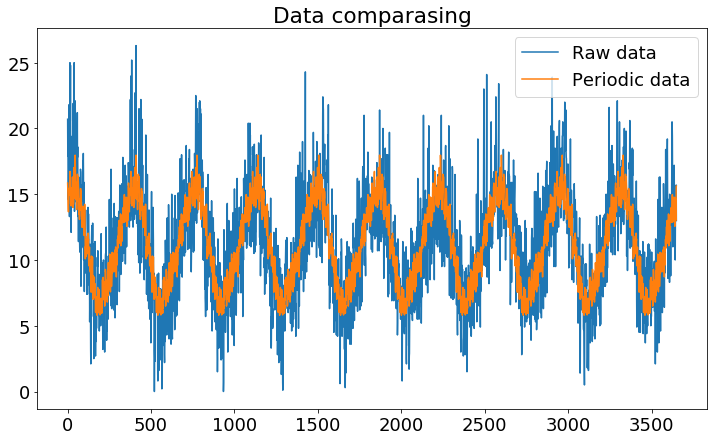

In [77]:
plt.rcParams.update({'font.size': 18})
plt.figure(figsize = (12,7))
plt.plot(x,  label = 'Raw data')
plt.plot(np.dot(A,z), label = 'Periodic data')
plt.title('Data comparasing')
plt.legend(loc = 'best')
plt.show()

In [78]:
# Place for your plots

If your solution is correct, you see that the obtained periodic approximation is **non-smooth**.

To ensure the smoothness in our periodic approximation, consider the following **regularized** least-squares problem:

$$L(z) = ||Az - x||^2 + \lambda R(z) \to \min_z ,$$

where $R(z)$ is some regularization term and $\lambda > 0$.
The term $R(z)$ reflects our additional assumptions on the smoothness of the periodic approximation $z$. One of the possible form of this term is:

$$ R(z) = \sum_{i=1}^m (z_{i+1} - z_i)^2.$$

Another form of the same regularization term is:

$$R(z) =  \|Dz\|_2^2.$$

Intuitevely, the regularization term aims to penalize "sharp" series, and the parameter $\lambda$ provides a trade-off between approximation quality (the first term) and the smoothness degree (the second term). Note, the case $\lambda = 0$ corresponds to the previously obtained solution $z^*$ (why?).
 



_2._ Your second task is to find the best **smooth** periodic approximation $z^*_s$ of the original data $x$.

- (5 pts) Implement function to construct matrix $D$ according to the template provided below. Don't forget about periodicity! What is the meaning of $D$?

Our matrix should have this structure to fulfill all demands ($-z_i$ corresponds main diagonal, $z_{i+1}$ corresponds the "diagonal" that is just upper, $z_{n1} = 1$ stands for periodicity): D =
$
\begin{bmatrix}
    -1 & 1 & 0 & \dots  & 0 & 0 \\
    0 & -1 & 1 & \dots  & 0 & 0 \\
    0 & 0 & 0 & \dots  & 0 & 0 \\
    \vdots & \vdots & \vdots & \ddots & \vdots & \vdots \\
    0 & 0 & 0 & \dots  & -1 & 1 \\
    1 & 0 & 0 & \dots  & 0 & -1
\end{bmatrix}
$
<br> 
Matrix D shows how far (in other words how big is the distance) are adjacent points from each other.

In [79]:
def build_D(m):
  '''
    Input: positive integer m
    Output: np.array of size (m, m)
  '''
  return(-np.eye(m,m)+np.diag(np.ones(m-1), 1)+np.diag(np.ones(1), -m+1))
  raise NotImplementedError()

D = build_D(z.shape[0])

- (3 pts) The optimality condition for the ordinary least-squares problem was derived during the lecture course. Using the same technique, for a given $\lambda$ derive an analog of the **normal equation** for the regularized least-squares problem formulated above.

$
0 = \nabla (\|Az_{min}-x\|_2^2 + \lambda R(z_{min})) = 
\nabla (\|Az_{min}-x\|_2^2 + \lambda \|Dz_{min}\|_2^2) = 
\big\\ \text{as on lecture 5} \big\\ = 
2( A^T(Az_{min}-x)+ \lambda D^TDz_{min}) \Rightarrow 
A^TAz_{min}-A^Tx = - \lambda D^TDz_{min} \Rightarrow 
(A^TA+ \lambda D^TD)z_{min} = A^Tx \Rightarrow
 A^{-T}(A^TA+ \lambda D^TD)z_{min} = x \Rightarrow
 z_{min} = (A+ \lambda A^{-T}D^TD)z_{min} = x
$ 
We obtained system in form $\hat{A}z=x$, but in solver we should use quadratic matrices, so we will use slightly different form ($(A^TA+ \lambda D^TD)z_{min} = A^Tx$)

- (1 pts) Solve the derived system. You are supposed to use previously constructed matrices $A$ and $D$.

In [80]:
lmbda = 1 # You are supposed to play with parameter $\lambda$ during your study

# Construct system
matrix = np.dot(np.transpose(A),A) +lmbda * np.dot(np.transpose(D), D)
rhs = np.transpose(A) @ x
z_s = np.linalg.solve(matrix, rhs)


- (2 pts) Plot the original data $x$ and smooth periodic approximation $Az^*_s$ for three increasing values of $\lambda$. You have to get three plots with two time series $x$ and $Az^*_s$ in every plot. How $\lambda$ affects plots?

As we can see, the more $\lambda$ we have, the smoothier solution we get.

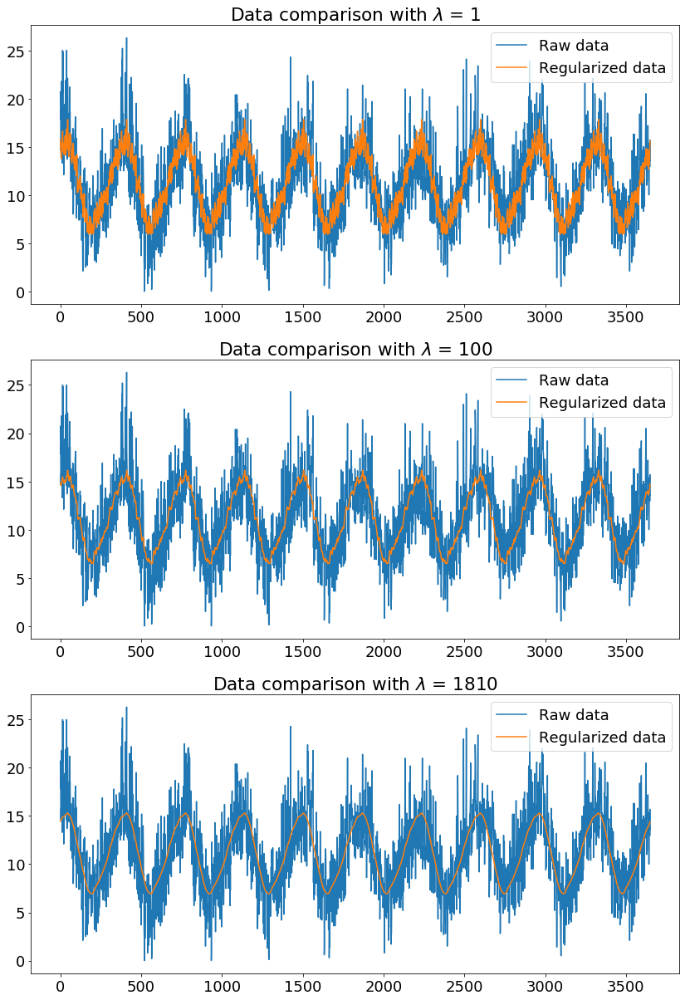

In [98]:
# Your solution is here
plt.rcParams.update({'font.size': 18})
plt.figure(figsize = (14,21))

plt.subplot(3, 1, 1)
plt.plot(x, label = 'Raw data')

lmbda = 1

matrix = np.dot(np.transpose(A),A) +lmbda * np.dot(np.transpose(D), D)
rhs = np.transpose(A) @ x
z_s = np.linalg.solve(matrix, rhs)

plt.plot(A @ z_s, label = 'Regularized data')
plt.title('Data comparison with $\lambda$ = %d' % lmbda)
plt.legend(loc = 'best')

plt.subplot(3, 1, 2)
plt.plot(x, label = 'Raw data')

lmbda = 100

matrix = np.dot(np.transpose(A),A) +lmbda * np.dot(np.transpose(D), D)
rhs = np.transpose(A) @ x
z_s = np.linalg.solve(matrix, rhs)

plt.plot(A @ z_s, label = 'Regularized data')
plt.title('Data comparison with $\lambda$ = %d' % lmbda)
plt.legend(loc = 'best')

plt.subplot(3, 1, 3)
plt.plot(x, label = 'Raw data')

lmbda = 1810 # It is explained below, why it

matrix = np.dot(np.transpose(A),A) +lmbda * np.dot(np.transpose(D), D)
rhs = np.transpose(A) @ x
z_s = np.linalg.solve(matrix, rhs)

plt.plot(A @ z_s, label = 'Regularized data')
plt.title('Data comparison with $\lambda$ = %d' % lmbda)
plt.legend(loc = 'best')

plt.show()


_3._ The final step is to build a model for predicting time series.

_-_ We want to predict $x_{k+1}$ based on $M$ previous observations.

_-_ Consider the following (linear) auto-regression (AR) model:

$$\hat{x}_{k+1} = \theta_1 x_k + \theta_2 x_{k-1} + \ldots + \theta_M x_{k-M+1},$$

with $M$ parameters $\theta_1, \ldots, \theta_M$ to be determined.

_-_ We fit the parameters by minimizing squared norm of the residual (again!):
    
$$(\hat{x}_{M+1} - x_{M+1})^2 + \ldots + (\hat{x}_n - x_n)^2 \to \min_{\mathbf{\theta}}.$$
    
_-_ This problem can be reformulated in a familiar form:

$$||X\theta - x||_2^2 \to \min_{\theta}.$$

- (7 pts) Implement function that constructs matrix $X \in \mathbb{R}^{(n-M) \times M}$ according to the template below. What structure does it have? Use appropriate function from ```NumPy/SciPy``` stack. 


In [82]:
def build_X(x, M):
  '''
    Input: np.array of size n, positive integer M
    Output: np.array of size (n - M, M)
  '''  
  return np.array([np.roll(x[:M],i) for i in range(x.shape[0]-M)])
  raise NotImplementedError()

Note, that the previously obtained smooth periodic approximation $z_s$ by itself can be regarded as a predictive model. However, we want to include the noise term in the model too, by fitting it with AR model:

In [122]:
x_n = x - A @ z_s # Extract noise
train_x = x_n[:x_n.shape[0] // 2] #  Train data to fit the model
test_x = x_n[x_n.shape[0] // 2:] #  Test data to validate the model
M = 89 # You are supposed to find the best parameter $M$ during your study
X_train = build_X(train_x, M)

- (3 pts) Once you constructed $X$ based on the training data, the fitting of the parameters $\theta$ again requires the solution of the linear least-squares problem. This time you are supposed to compute pseudoinverse of $X$ via QR decomposition. Hint: use ```numpy.linalg.qr()``` function.

$A^{\dagger} = (R^*R)^{-1}(QR)^* = R^{-1}Q^*$

In [123]:
def build_pseudoinverse_QR(A):
  '''
    Input: np.array of size (n - M, M)
    Output: np.array of size (M, n - M)
  '''  
  Q, R = np.linalg.qr(A) # Performing QR for our matrix
  return np.dot(np.linalg.inv(R), np.transpose(Q))
  raise NotImplementedError()

X_inv = build_pseudoinverse_QR(X_train)
theta = X_inv @ train_x[M:]

- (3 pts) Check your model with test data. Plot your predicted noise series and test noise series in one plot. Next, add smooth trend $Az_s$ back to predicted noise series and plot it with the original series $x$ in one plot. You have to get two plots with two time series in every plot. Be careful with indexing!

In [124]:
test_X = build_X(test_x, M)
predicted = test_X @ theta
# Plotting

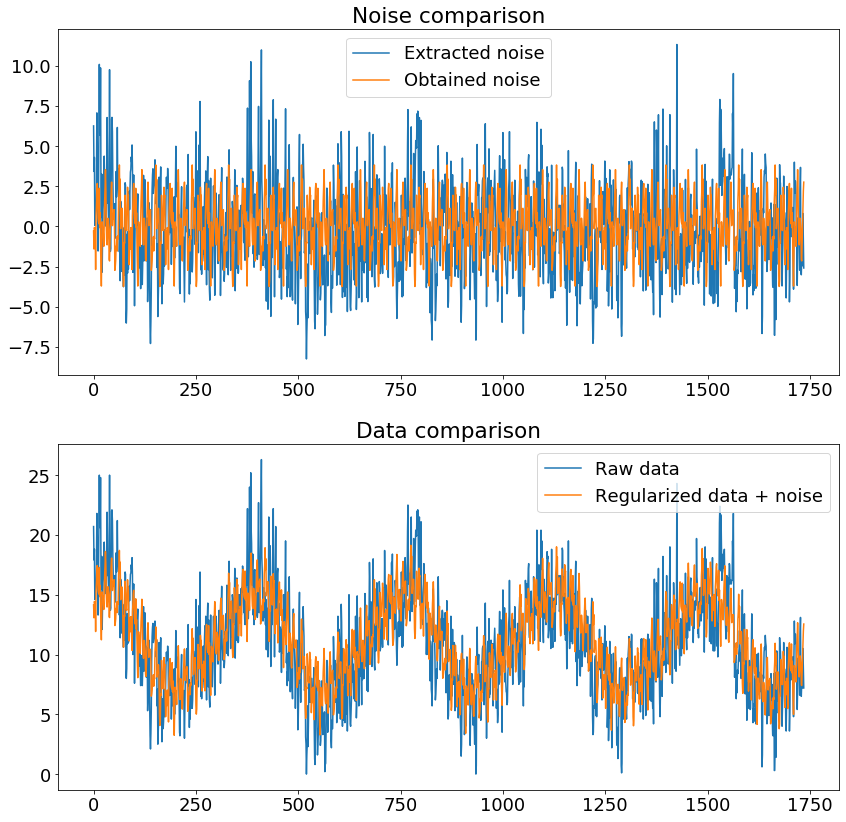

In [125]:
plt.figure(figsize = (14,14))
plt.rcParams.update({'font.size': 18})
plt.subplot(2, 1, 1)
plt.plot(x_n[:predicted.shape[0]], label = 'Extracted noise')



plt.plot(predicted, label = 'Obtained noise')
plt.title('Noise comparison')
plt.legend(loc = 'best')
A_ = A @ z_s
plt.subplot(2, 1, 2)
plt.plot(x[:predicted.shape[0]], label = 'Raw data')
plt.plot(predicted + A_[:predicted.shape[0]], label = 'Regularized data + noise')
plt.title('Data comparison')
plt.legend(loc = 'best')

plt.show()


- (Bonus) How valuable is your model for real time prediction? Try to perform honest time-marching with your model starting from $x_{M+1}$ to $x_{M+100}$. Is it still good? Try to choose the best parameters $M$ and $\lambda$.


I've tried  honest time marshing (I suppose it should be done with cycles) with increasing M from 3 to 103, and plot whole series of graphs. Perfomance seems to be inconsistent (For $M = 90$ it's insane, for example). but for bigger M amplitude of noise is getting bigger and noise "baseline" (median of the osccilations) is going up (from $M \approx 620$ and higher)for sure. 

C:\Users\alexh\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


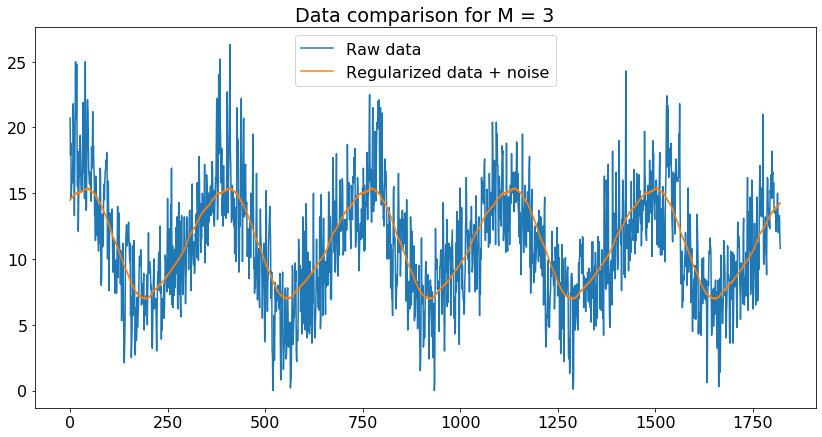

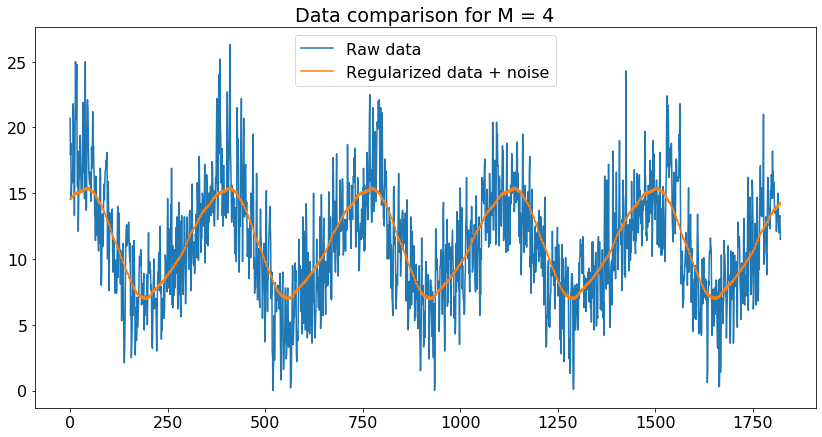

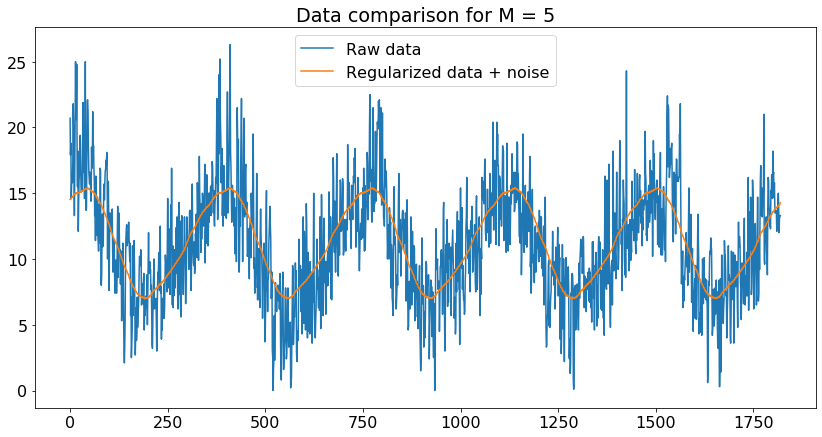

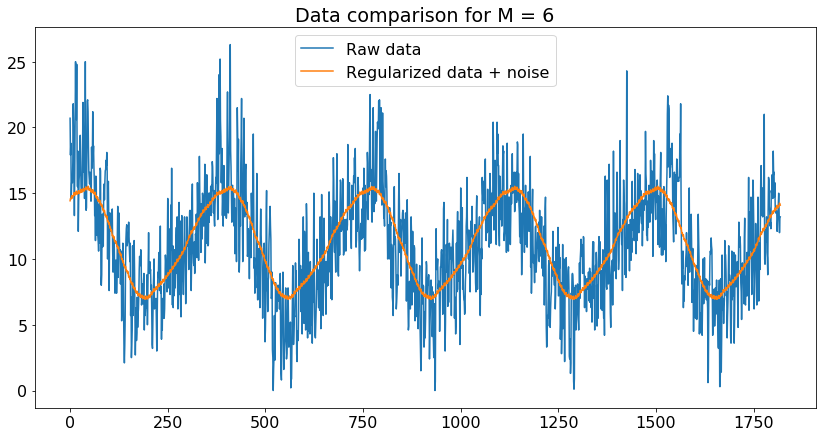

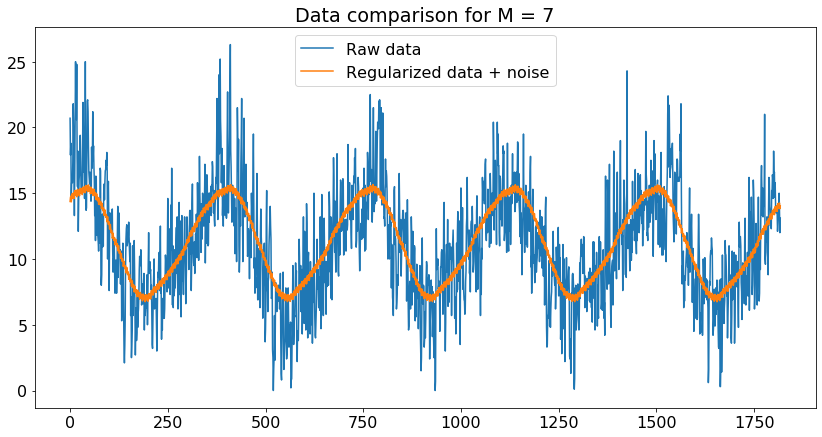

...

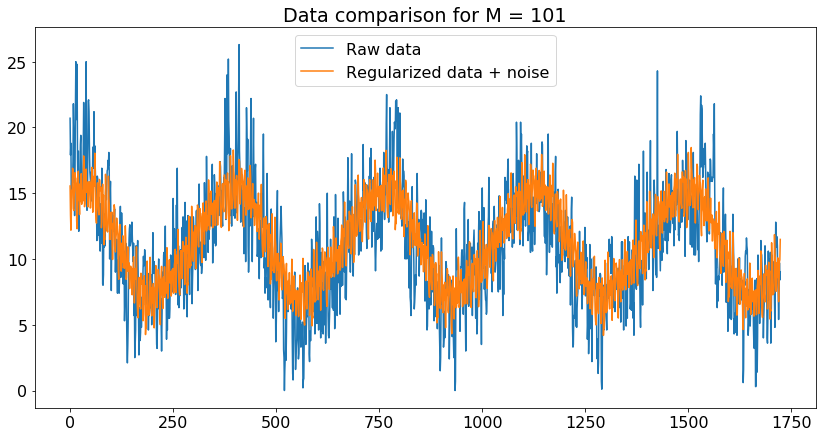

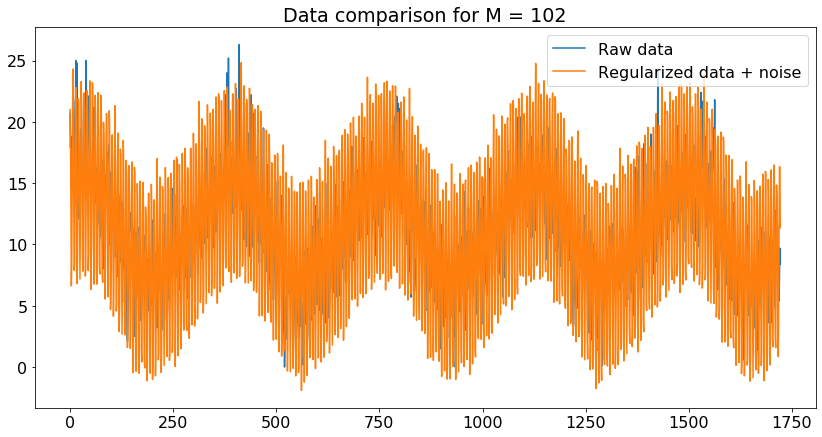

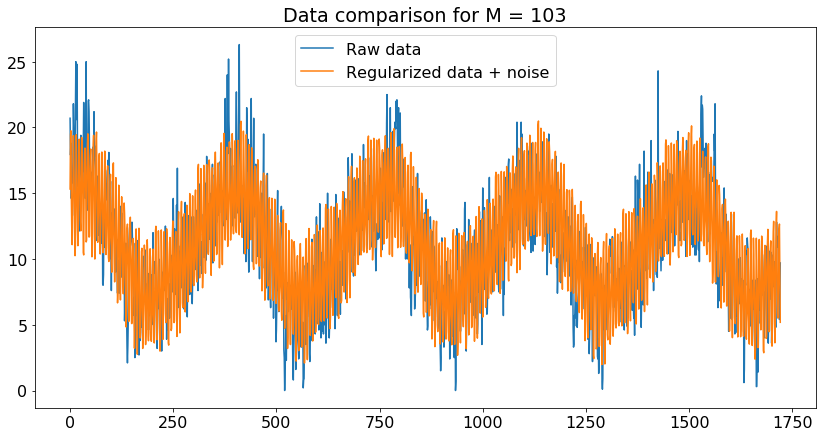

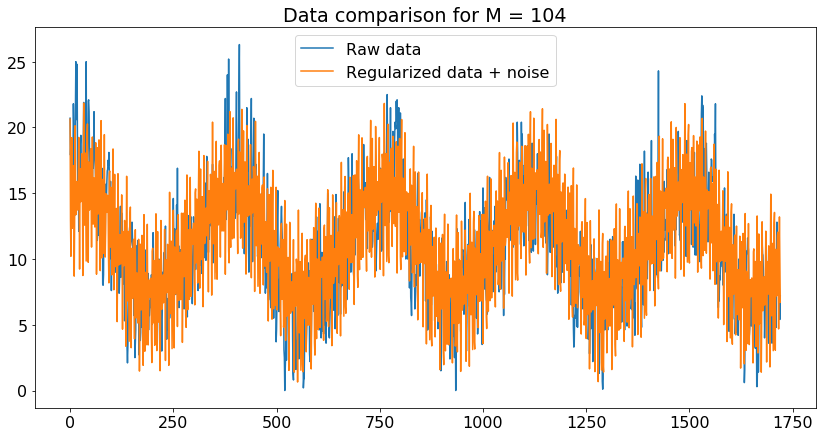

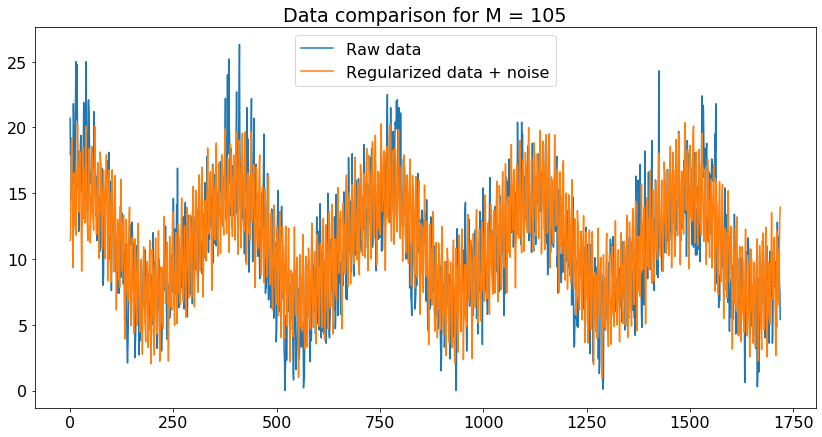

In [126]:
x_n = x - A @ z_s 
A_ = A @ z_s
train_x = x_n[:x_n.shape[0] // 2] 
test_x = x_n[x_n.shape[0] // 2:] 
M_ = [i+3 for i in range(103)]
for M in M_:
    X_train = build_X(train_x, M)
    X_inv = build_pseudoinverse_QR(X_train)
    theta = X_inv @ train_x[M:]
    test_X = build_X(test_x, M)
    predicted = test_X @ theta
    plt.figure(figsize = (14,7))
    plt.rcParams.update({'font.size': 16})
    plt.plot(x[:predicted.shape[0]], label = 'Raw data')
    plt.plot(predicted + A_[:predicted.shape[0]], label = 'Regularized data + noise')
    plt.title('Data comparison for M = %d' % M)
    plt.legend(loc = 'best')
    #er.append(np.linalg.norm((x_n[:predicted.shape[0]] - predicted), ord=2))

So lets try to estimate best in big cycle again, comparing relative error of prediction (because absolute kind of does not make sense in case of noise here).

In [128]:
x_n = x - A @ z_s 
A_ = A @ z_s
train_x = x_n[:x_n.shape[0] // 2] 
test_x = x_n[x_n.shape[0] // 2:] 
M_ = [i+1 for i in range(100)] # I am scared of overfitting, so I'll stop with M = 103
er = []
for M in M_:
    X_train = build_X(train_x, M)
    X_inv = build_pseudoinverse_QR(X_train)
    theta = X_inv @ train_x[M:]
    test_X = build_X(test_x, M)
    predicted = test_X @ theta
    er.append(np.linalg.norm(x_n[:predicted.shape[0]] - predicted, ord = 1) / np.linalg.norm(predicted, ord = 1)) 


No handles with labels found to put in legend.


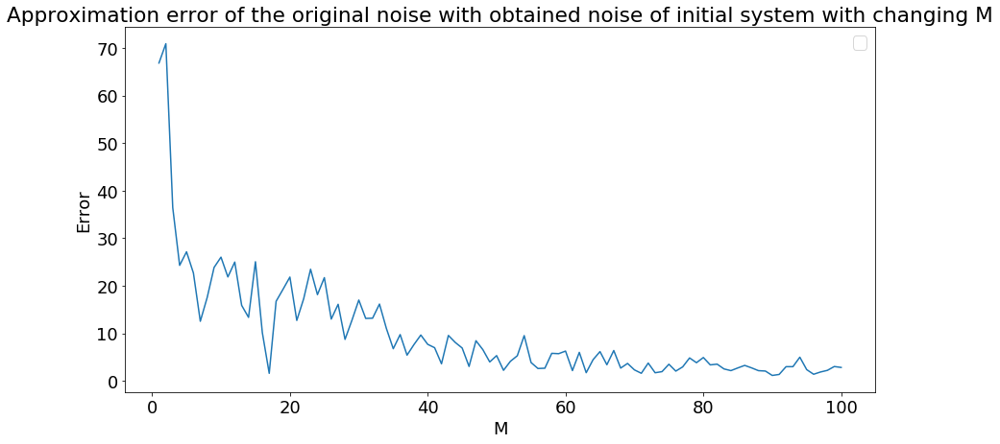

The best estimated M = 89 


In [137]:
plt.figure(figsize = (14,7))
plt.plot(M_,er)
plt.rcParams.update({'font.size': 18})
plt.xlabel('M')
plt.ylabel('Error')
plt.title('Approximation error of the original noise with obtained noise of initial system with changing M')
plt.legend(loc = 'best')
plt.show()
print('The best estimated M = %d ' % er.index(np.min(er)))

I have an idea of evaluatuing $\lambda$. Since we are for sure using some periodic signal with noise, we can perform FFT to get rid of it. SO we will obtain presumably original unnoisy signal. 
I used certain guidline for FFT (link: http://scipy-lectures.org/intro/scipy/auto_examples/plot_fftpack.html).

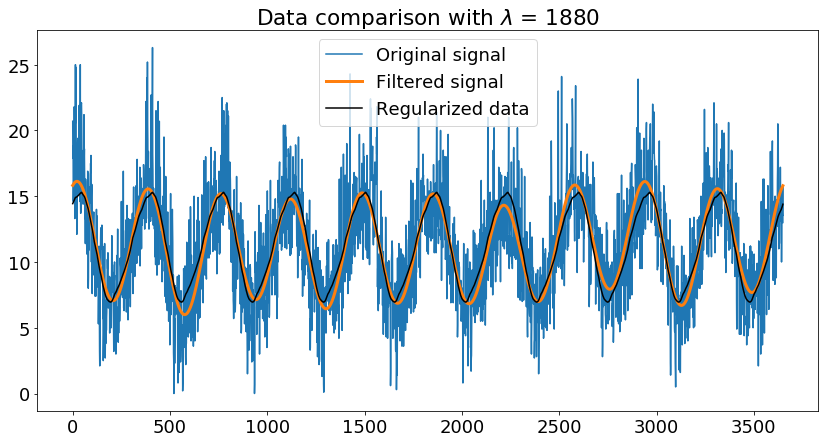

In [97]:
from scipy import fftpack
time_step = 0.02
sig_fft = fftpack.fft(x)
power = np.abs(sig_fft)

sample_freq = fftpack.fftfreq(x.size, d=time_step)
pos_mask = np.where(sample_freq > 0)
freqs = sample_freq[pos_mask]
peak_freq = freqs[power[pos_mask].argmax()]

high_freq_fft = sig_fft.copy()
high_freq_fft[np.abs(sample_freq) > peak_freq] = 0
filtered_sig = fftpack.ifft(high_freq_fft)

plt.figure(figsize=(14, 7))
plt.rcParams.update({'font.size': 18})
plt.plot(x, label='Original signal')
plt.plot(filtered_sig, linewidth=3, label='Filtered signal')

plt.legend(loc='best')


lmbda = 1810

matrix = np.dot(np.transpose(A),A) +lmbda * np.dot(np.transpose(D), D)
rhs = np.transpose(A) @ x
z_s = np.linalg.solve(matrix, rhs)

plt.plot(A @ z_s, label = 'Regularized data', c= 'k')
plt.title('Data comparison with $\lambda$ = %d' % lmbda)
plt.legend(loc = 'best')

plt.show()


What can we say about it? Obtained filtered signal is actually not so periodic (maybe it is, but the period can be bigger than 3500 time units). But is ok, now we want to check signal for our $\lambda$ to be close enough to the filtered signal. 
The main issue - our periodic function cannot fit both high and low peaks of filtered signal, for the first try I choose $\lambda = 4000$, because it visually suits latter criteria (nearly equidistant to the highest and the lowest peak and provides very smooth solution). 
I also see several ways to improve my idea. 
First (rather intuitive) - to organize a cycle (I'm deeply sorry for that, but I could not find another way, that is not time/memory consumpting or overcomplicated) for a list of $\lambda$ to compute just simple 2-norm of Sig_obtained-Sig_filtered.

In [93]:
L = [100+i for i in range(5900)] # veeery big cycle, but it 
time_step = 0.02
er = []
for lmbda in L: # this code is basically the summaryof most of methods and function I used
    matrix = np.dot(np.transpose(A),A) +lmbda * np.dot(np.transpose(D), D) 
    rhs = np.transpose(A) @ x
    z_s = np.linalg.solve(matrix, rhs)
    sig_fft = fftpack.fft(x)
    power = np.abs(sig_fft)
    sample_freq = fftpack.fftfreq(x.size, d=time_step)
    pos_mask = np.where(sample_freq > 0)
    freqs = sample_freq[pos_mask]
    peak_freq = freqs[power[pos_mask].argmax()]
    high_freq_fft = sig_fft.copy()
    high_freq_fft[np.abs(sample_freq) > peak_freq] = 0
    filtered_sig = fftpack.ifft(high_freq_fft)
    er.append(np.linalg.norm((filtered_sig - A @ z_s), ord=2)/np.linalg.norm(A @ z_s)) # 2- norm


No handles with labels found to put in legend.


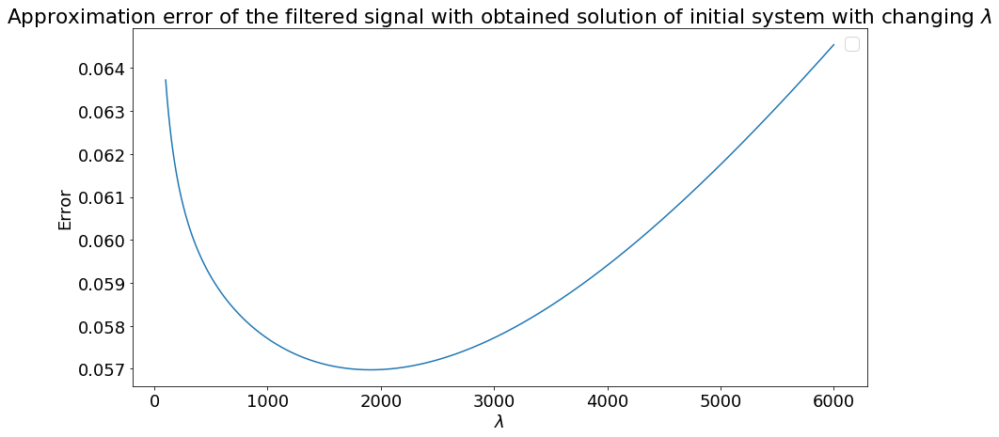

The closest to the filtered signal solution of regularization problem corresponds to the $\lambda$ = 1810 


In [94]:
plt.figure(figsize=(14, 7))
plt.rcParams.update({'font.size': 18})
plt.plot(L,er)
plt.xlabel('$\lambda$')
plt.ylabel('Error')
plt.title('Approximation error of the filtered signal with obtained solution of initial system with changing $\lambda$')
plt.legend(loc = 'best')

plt.show()
print('The closest to the filtered signal solution of regularization problem corresponds to the $\lambda$ = %d ' % er.index(np.min(er)))

#### Turns out, that this $\lambda = 1810$ suits filtered signal slightly better than $4000$, so we can remember this value (it is actually used before)! But I assume the difference is still insignificant, so $\lambda = 4000$, for instance, gives more smooth solution with less precise fitting to filtered signal. To summarise this short analysis, FFT gives at least some final result and you can estimate good enough $\lambda$ for fitting noisy time series. From the other hand, now we fit not initial signal, but some "product" of FFT-blackbox.

# Problem 2 (Theoretical tasks)  (26 pts)

_1._
- (1 pts) what are the constants $C_1$ and $C_2$ such that $C_1 \|x\|_{\infty} \leq \|x\|_2 \leq C_2 \| x\|_{\infty}$
- (5 pts) Prove that $\| U A \|_F = \| A U \|_F = \| A \|_F$ for any unitary matrix $U$.
- (5 pts) Prove that $\| U A \|_2 = \| A U \|_2 = \| A \|_2$ for any unitary matrix $U$.
  
_2._
- (5 pts) Using the results from the previous subproblem, prove that $\| A \|_F \le \sqrt{\mathrm{rank}(A)} \| A \|_2$. _Hint:_ SVD will help you.
- (5 pts) Show that for any $m, n$ and $k \le \min(m, n)$ there exists $A \in \mathbb{R}^{m \times n}: \mathrm{rank}(A) = k$, such that $\| A \|_F = \sqrt{\mathrm{rank}(A)} \| A \|_2$. In other words, show that the previous inequality is not strict.
- (5 pts) Prove that if $\mathrm{rank}(A) = 1$, then $\| A \|_F  = \| A \|_2$.
- (5 pts) Prove that $\| A B \|_F \le \| A \|_2 \| B \|_F$.

## Solution

#### 1.1  (1 pts) what are the constants $C_1$ and $C_2$ such that $C_1 \|x\|_{\infty} \leq \|x\|_2 \leq C_2 \| x\|_{\infty}$

$
{\|x\|_2}^2 = \sum_{i=1}^{n} |x_i|^2 \leq 
n \cdot \smash{\displaystyle\max_{1 \leq i \leq n}} |x_i|^2 = 
n \cdot {(\smash{\displaystyle\max_{1 \leq i \leq n}} |x_i|)}^2 =
n \cdot {\| x\|_{\infty}}^2 
\Rightarrow \|x\|_2 \leq \sqrt{n} \|x\|_{\infty} \\
\|x\|_{\infty} = \smash{\displaystyle\max_{1 \leq i \leq n}} |x_i| \leq
\sqrt{\sum_{i=1}^{n} |x_i|^2} = 
\|x\|_2, \text{ since } \sqrt{{x_1}^2+\ldots+{x_n}^2} = 
x_{max}\sqrt{(\frac{x_1}{x_{max}})^2+\ldots+1+\ldots+(\frac{x_n}{x_{max}})^2} \geq x_{max} = 
\smash{\displaystyle\max_{1 \leq i \leq n}} |x_i| \\
\text{Answer: } \|x\|_{\infty} \leq \|x\|_2 \leq \sqrt{n} \| x\|_{\infty}
$

#### 1.2 (5 pts) Prove that $\| U A \|_F = \| A U \|_F = \| A \|_F$ for any unitary matrix $U$.
$
\text{From NLA lectures and linear algebra course we know following properties:}\\
\| A \|_F = \sqrt{\mathrm{tr}(A^*A)},\ \mathrm{tr}(ABC) = \mathrm{tr}(BCA) = \ldots \text{(invariant under cyclic permutations)} 
\Rightarrow \\ 
\| U A \|_F = \sqrt{\mathrm{tr}((UA)^*(UA))} = \sqrt{\mathrm{tr}(A^*U^*UA)} = \sqrt{\mathrm{tr}(A^*A)} = \| A \|_F, \\
\| A U \|_F = \sqrt{\mathrm{tr}((AU)^*(AU))} = \sqrt{\mathrm{tr}(U^*A^*AU)} =
\sqrt{\mathrm{tr}(A^*AUU^*)} =\sqrt{\mathrm{tr}(A^*A)} = \| A \|_F
$

#### 1.3 (5 pts) Prove that $\| U A \|_2 = \| A U \|_2 = \| A \|_2$ for any unitary matrix $U$.
$
\text{From NLA lectures and linear algebra course we know following properties:}\\
\| A \|_F \sqrt{\mathrm{tr}(A^*A)},\ \mathrm{tr}(ABC) = \mathrm(tr)BCA = \ldots \text{(invariant under cyclic permutations)} 
\Rightarrow \\ 
\| U A \|_2 = {\sigma}_1(UA) = \sqrt{{\lambda}_{max}(A^*U^*UA)} = \sqrt{{\lambda}_{max}(A^*A)} = \| A \|_2, \\
\| A U \|_2 = {\sigma}_1(AU) = \sqrt{{\lambda}_{max}(U^*A^*AU)} =
\sqrt{{\lambda}_{max}(U^{-1}A^*AU)} =\sqrt{{\lambda}_{max}(A^*A)} = \| A \|_2, 
\text{ since } U^* = U^{-1} \text{ and eigen values of }\ U^{-1}QU\ { and }\ Q\ \text{are basically the same, where}\ Q = A^*A
$

#### 2.1 (5 pts) Using the results from the previous subproblem, prove that $\| A \|_F \le \sqrt{\mathrm{rank}(A)} \| A \|_2$. _Hint:_ SVD will help you.
Let's follow the advice and perform SVD for our matrix A:
$
\| A \|_F = \| U \Sigma V^* \|_F = \sqrt{\mathrm{tr}(V {\Sigma}^* U^* U \Sigma V^*)} = 
\sqrt{\mathrm{tr}({\Sigma}^*\Sigma )} = \sqrt{\mathrm{tr}(A^* A)} = 
\sqrt{{{\sigma}_1}^2+\ldots+{{\sigma}_r}^2}, r = \mathrm{rank}(A) \\
\| A \|_2 = \| U \Sigma V^* \|_2 = {\sigma}_1(A) \Rightarrow \\
\| A \|_F = \sqrt{\sum_{i=1}^{r} {{\sigma}_i}^2} \leq \sqrt{{{\sigma}_1}^2 \cdot r} =
{\sigma}_1\sqrt{ r} = \| A \|_2 \sqrt{\mathrm{rank}(A)} 
$

#### 2.2 (5 pts) Show that for any $m, n$ and $k \le \min(m, n)$ there exists $A \in \mathbb{R}^{m \times n}: \mathrm{rank}(A) = k$, such that $\| A \|_F = \sqrt{\mathrm{rank}(A)} \| A \|_2$. In other words, show that the previous inequality is not strict. <br>

The place in proof of 2.1 where from equality we moved to inequality is $\sqrt{\sum_{i=1}^{r} {{\sigma}_i}^2} \leq \sqrt{{{\sigma}_1}^2 \cdot r}$. So if for any $m, n$ and $k \le \min(m, n)$ we will find such matrix A that have equal singular values we will solve this problem. Example - rectangular matrix that have exact number on diagonal (since rectangular matrix does not have a diagonal, as diagonal we will consider elements that have indices $\ i=j,\ i=1 \dots k, j=1 \dots k, k \le \min(m, n)$) k times (let's consider $n>m$, it does not matter for general case):<br>
$
\begin{equation*}
A_{i,j} = 
 \begin{cases}
   \lambda, &\ i=j,\ i=1 \dots k, j=1 \dots k, k \le \min(m, n)\\
   0, &\text{otherwise}
 \end{cases}
\end{equation*} 
$
<br>
Then for any number $\lambda$ we can construct $A^*A : \\ $ <br>
$
\begin{bmatrix}
    {\lambda}^2 & 0 & 0 & \dots  & 0 \\
    0 & {\lambda}^2 & 0 & \dots  & 0 \\
    \vdots & \vdots & \vdots & \ddots & \vdots \\
    0 & 0 & 0 & \dots  & 0
\end{bmatrix}
\\
$
<br>
So constructed matrix A will have exactly $k$ equal singular values $= \lambda$, thus we will have desired inequality and solve initial problem.


#### 2.3 (5 pts) Prove that if $\mathrm{rank}(A) = 1$, then $\| A \|_F  = \| A \|_2$.
$
\mathrm{rank}(A) = 1 \Rightarrow {\sigma}_2 = {\sigma}_3 = \ldots = {\sigma}_r = 0 \Rightarrow 
\| A \|_F = \sqrt{\sum_{i=1}^{r} {{\sigma}_i}^2} = \sqrt{{{\sigma}_1}^2} = {\sigma}_1 = \| A \|_2
$

#### 2.4 (5 pts) Prove that $\| A B \|_F \le \| A \|_2 \| B \|_F$.
$
\|B\|_F^2 = \sum\limits_{i=1}^n \sum\limits_{j=1}^n|b_{ij}|^2 \Rightarrow 
\big\\ \text{Let }  b_1, \ldots, b_n - \text{columns of } B \rightarrow b_{i1}^2 + \ldots + b_{in}^2  = 
\|b_i\|_2^2 \big\\ \Rightarrow 
\|B\|_F^2 = \sum\limits_{i=1}^n\|b_i\|_2^2 \Rightarrow \\
\|AB\|_F^2=\sum_{i=1}^n\|Ab_i\|_2^2 \Rightarrow 
\big\\ \|Ax\|_2\leq\|A\|_2\|x\|_2 \text{ (general property - matrix and vector norms are compatible)} \big\\ \Rightarrow
\|AB\|_F^2 \leq \|A\|_2^2\sum_{i=1}^n\|b_i\|_2^2=\|A\|_2^2\|B\|_F^2
$

Most useful source for all this tasks - lectures obviously. Besides I found very informative Stanford Lectures (link: https://statweb.stanford.edu/~souravc/Lecture32.pdf) and "Numerical Linear Algebra" by Mehrmann. Also task 2.4 is similarly described both in Stanford Lectures and Stackoverflow (I believe that first is orogonal source though).

# Problem 3 (Matrix calculus) (15 pts)

_1._ (5 pts) Consider the following function

$$ F(U, V) = \frac{1}{2}\|X - UV\|_F^2, $$

where $X \in \mathbb{R}^{n \times n}$, $U \in \mathbb{R}^{n \times k}$ and $V \in \mathbb{R}^{k \times n}$ and $k < n$. 

- (2 pts) Derive analytical expression for the gradient of the function $F$ with respect to $U$ 
- (2 pts) Derive analytical expression for the gradient of the function $F$ with respect to $V$
- (1 pts) Estimate computational complexity of computing these gradients (in big-O notation). 

_2._ (2 pts) Derive analytical expression for the gradient of the function $f$:

$$ R(x) = \frac{(Ax, x)}{(x, x)}, $$

where $A$ is a symmetric real matrix. Why the gradient of this function is important in NLA you will know in the lectures later.

_3._ (8 pts) Consider the following function $f$ 

$$f(w) = \log\det\left(\sum_{i=1}^m w_i x_i x_i^{\top}\right),$$

where $x_i, \; i = 1,\dots,m$ are given column vectors. 


- (3 pts) Derive analytical expression for the gradient of $f$
- (1 pts) For what values of $m$ and vectors $x_i$ the function $f$ makes sense and is finite?
- (4 pts) Consider two approaches to compute it: directly with matrix products and so on and the single-line solution with ```einsum``` function.   
Generate some set of vectors $x_i \in \mathbb{R}^{1000}$ such that the funtion $f$ is finite and compare the time of computing derived gradient with these approaches. Use [%timeit](https://docs.python.org/3.6/library/timeit.html) command to measure time. What do you think about the reason of such behaviour? 

## Solution

#### 3.1
$
\nabla_U \|X - UV\|_F^2 = \nabla_U [\mathrm{tr}(X-UV)^*(X-UV)] = 
\nabla_U [\big((X-UV), (X-UV)\big)] = 
-\nabla_U (X, X) -\nabla_U (UV, X) -\nabla_U (X,UV) + \nabla_U (UV, UV)  \\ 
\cfrac{d}{dU} (UV, X) \big[= \cfrac{d}{dU} (X, UV)\big] =
\cfrac{d}{dU} \big( XV^*, U\big) = \cfrac{d}{dU} \big( XV^*, dU\big) \Rightarrow  
\nabla_U (UV, X) = XV^*  \\
\cfrac{d}{dU} (UV, UV) = \cfrac{d}{dU} (UVV^*,U) = \big\\ VV^* = A, A = A^* \big\\ =
\cfrac{d}{dU} (UA, U) = \big(dUA, U\big) + \big(UA, dU\big) = 
\big(UA^*, dU\big) + \big(UA, dU\big) = \big(2UA, dU\big) \Rightarrow  
\nabla_U (UV, UV) = 2UA = 2UVV^*\\
\Rightarrow \nabla_U \|X - UV\|_F^2 = 
-\nabla_U (X,X) -\nabla_U (UV,X) -\nabla_U (X,UV) + \nabla_U (UV,UV) = 
0 -XV^* -XV^* +2UVV^* = -2XV^* + 2UVV^* = -2XV^T + 2UVV^T \Rightarrow \\ 
\nabla_U F(U,V) = -XV^T + UVV^T = -(X-UV)V^T \\
$

Similar for $\nabla_V \|X - UV\|_F^2$:

<br>
$
\nabla_V \|X - UV\|_F^2 = \nabla_V [\mathrm{tr}(X-UV)^*(X-UV)] = 
\nabla_V [(X-UV), (X-UV)] = \nabla_V [\big((X-UV), (X-UV)\big)] = 
-\nabla_V (X, X) -\nabla_V (UV, X) -\nabla_V(X, UV) + \nabla_V (UV, UV)  \\ 
\cfrac{d}{dV} (UV,X) \big[= \cfrac{d}{dV} (X,UV)\big] =
\cfrac{d}{dV} \big( U^*X, V\big) = \big(U^*X, dV\big) \Rightarrow
\nabla_V (UV,X) = U^*X  \\
\cfrac{d}{dV} (UV,UV) = \cfrac{d}{dV} (U^*UV,V) = \big\\ U^*U = B, B = B^* \big\\ =
\cfrac{d}{dV} (BV,V)  = \big(BdV, V\big) + \big(BV, dV\big) = 
\big(B^*V, dV\big) + \big(BV, dV\big) = \big(2BV, dV\big) \Rightarrow  
\nabla_V (UV,UV) = 2BV = 2U^*UV\\
\Rightarrow \nabla_V \|X - UV\|_F^2 = \nabla_V [(X-UV)(X-UV)] = 
-\nabla_V (X,X) -\nabla_V (UV, X) -\nabla_V (X, UV) + \nabla_V (UV, UV) = 
0 -U^*X -U^*X +2U^*UV = -2U^*X + 2U^*UV = -2U^TX + 2U^TUV \Rightarrow \\
\nabla_V F(U,V) = -U^TX + U^TUV = -U^T(X-UV)
$


For me in this task was useful "Matrix Cookbook", especially number 119 for self test (in 2012 version of book):
$\cfrac{d}{dX} \mathrm{tr}[(AXB+C)(AXB+C)^T] = 2A^T(AXB+C)B^T$
<br>
About computational complexity: most complicated operations we're doing here are multiplication - $O(n^2k)$ (On lectures we had $O(2n^3+n^2)$ for matrices with equal dimensions, so in our case more precise answer will be $O(2n^2k+nk)$, where "quadratic part" corresponds to summation).

#### 3.2
$
dR(x) = \cfrac{(x, x) \cdot d(Ax, x) - d(x, x) \cdot (Ax, x)}{(x, x)^2}: \\
d(Ax, x) = (Ax, dx)+(Adx, x) = ((A+A^T)x, dx) = 2(Ax, dx), \ d(x,x) = (x, dx)+(dx, x) = 2(x, dx) \Rightarrow \\
dR(x) = \cfrac{(x, x) \cdot 2(Ax, dx) - 2(x, dx) \cdot (Ax, x)}{(x, x)^2} = 
2\cfrac{((x, x) \cdot Ax, dx) - ((Ax, x) \cdot x, dx) }{(x, x)^2} \Rightarrow \\
\nabla_x R(x) = 2\cfrac{(x, x) \cdot Ax - (Ax, x) \cdot x}{(x, x)^2} =
2\cfrac{Ax \cdot (x, x) - x \cdot (Ax, x)}{(x, x)^2}
$



#### 3.3
a) 
$
\text{Let } W = \sum_{i=1}^{m}w_i x_i x_i^{T}, \ f(w) = \log\det W \Rightarrow \\
\big\\ d(\det W) = \det W \cdot (W^{-T}, dW) \text{ - from first seminar }\big\\ \Rightarrow 
df(W) = \cfrac{1}{\det W} \cdot \det W \cdot (W^{-T}, dW) = (W^{-T}, dW) \Rightarrow
\big\\ {\left(\cfrac{dW}{dw}\right)}_i = 
\cfrac{\partial \sum_{j=1}^m w_j x_j x_j^{T}}{\partial w_i} =
x_i x_i^{T} \Rightarrow {(dW)}_i = x_i x_i^{T} dw_i\big\\ \Rightarrow
(df)_i = (W^{-T}, x_i x_i^{T} dw_i) = (W^{-T}, x_i x_i^{T}) dw_i \Rightarrow \\
(\nabla f(w))_i = \nabla_i f(w) = (W^{-T}, x_i x_i^{T}) = \mathrm{tr} (W^{-1}x_i x_i^{T}) \Rightarrow \\
\nabla f(w) = \big(\mathrm{tr} (W^{-1}x_1 x_1^{T}) \ , \dots,\ \mathrm{tr} (W^{-1}x_m x_m^{T})\big) = 
\big(\mathrm{tr} ((\sum_{i=1}^{m}w_i x_i x_i^{T})^{-1}x_1 x_1^{T}) \ , \dots,\ 
\mathrm{tr} ((\sum_{i=1}^{m}w_i x_i x_i^{T})^{-1} x_m x_m^{T})\big) \\
$
<br>
b) When our function does not make sense? Since we are working with log function, its argument should be > 0. When $\det(W) \leq 0?$ 
<br>
Lets consider $\mathscr{L} = <x_1, \ldots, x_N>$. If our sum $W = \sum_{i=1}^{m}w_i x_i x_i^{T}$ (sum of $m$ matrices of rang=1) will contain linearly dependent vectors and less components than $N$ (so if $ m < N = \dim \mathscr{L}$), then determinant will be 0 (then $\exists K>m$ (such vector exists) $: x_K \in \mathscr{L}$, that will be orthogonal to $x_1, \ldots, x_m$ from $\sum_{i=1}^{m}w_i x_i x_i^{T}$, then $Wx_K = 0$), and we can find such w that will turn whole sum into zero,  thus $m$ should be $\geq$ $N$.
 

In [3]:
# Your solution is here
# c)
import numpy as np
def LoopSum(m,x,w):
    trace = 0
    #Inv_sum = 0
    Sum = 0
    for i in range(m):
        Outer_x = np.outer(x[i], x[i]) # xx^t - outer product
        for j in range(m):
            Outer_2 = np.outer(x[j], x[j])
            Sum += w[j]*Outer_2
    Inv_sum = np.linalg.inv(Sum)
    trace  = Inv_sum @ Outer_x                     
    return trace

def LoopSum2(m,x,w):     
# the same, but rearranged into 1 string
    return [np.trace(np.linalg.inv(sum([w[j]*np.outer(x[j], x[j]) for j in range(m)])) @ np.outer(x[i], x[i])) for i in range(m)]

def Einsum(m,x,w):
# here is one-line solution that you wanted                          
    return [np.einsum('ii', np.einsum('ij,jk->ik', np.linalg.inv(sum([ w[j]*(np.einsum('i,j->ij', x[j], x[j])) for j in range(m)])), np.einsum('i,j->ij', x[i], x[i]))) for i in range(m)]

                                         
m = 1000
x = [np.random.random(1000) for _ in range(m)]
w = np.ones(m) # why not to use simple w

%timeit LoopSum(m,x,w)
%timeit Einsum(m,x,w)

Nice guide for einsum: https://stackoverflow.com/questions/26089893/understanding-numpys-einsum. Here basically I saw how to calculate trace ('ii'), outer product (np.einsum('i,j->ij', x[j], x[j])) and most of other operations. Einsum is supposed to be faster.

# Problem 4. Compression of the fully-connected layers in neural network with simple architecture (20 pts)

In this problem we consider the neural network that performs classification of the dataset of images. 
Any neural network can be considered as composition of simple linear and non-linear functions.
For example, a neural network with 3 layers can be represented as 

$$f_3(f_2(f_1(x, w_1), w_2), w_3),$$

where $x$ is input data (in our case it will be images) and $w_i, \; i =1,\dots,3$ are parameters that are going to be trained. 

We will study the compression potential of neural network with simple architecture: alternating some numbers of linear and non-linear functions. 

The main task in this problem is to study how the compression of fully-connected layers affects the test accuracy.
Any fully-connected layer is represented as linear function $AX + B$, where $X$ is input matrix and $A, B$ are trainable matrices. Matrices $A$ in every layer are going to be compressed.
The main result that you should get is the plot of dependence of test accuracy on the total number of parameters in the neural network.

#### Zero step: install PyTorch

- Follow the steps in [official instructions](https://pytorch.org/get-started/locally/)

#### First step: download CIFAR10 dataset

In [40]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets, transforms
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

batch_size = 100

transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader = torch.utils.data.DataLoader(datasets.CIFAR10('./', train=True, download=True, transform=transform), 
                                        batch_size=batch_size, shuffle=True)

test_loader = torch.utils.data.DataLoader(datasets.CIFAR10('./', train=False, transform=transform), 
                                          batch_size=batch_size, shuffle=True)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified


#### Check what images are we going to classify

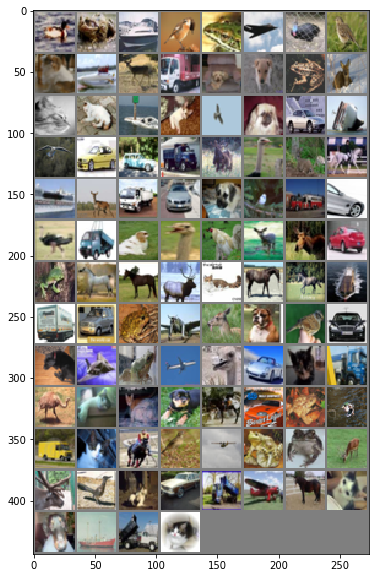

 bird  frog  ship  bird  frog plane  bird  bird


In [41]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(20, 10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(train_loader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(8)))


### Second step: neural network architecture

For simplicity and demonstration purposes of the neural network compression idea consider the architecture consisting of the only fully-connected layers and non-linear ReLU functions between them.
To demonstrate compression effect, consider the dimension of the inner layers equals to 1000.

Below you see implementation of such neural network in PyTorch.
More details about neural networks you will study in the *Deep learning* course in one of the upcoming term

In [42]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(3 * 32 * 32, 1000)
        self.fc2 = nn.Linear(1000, 1000)
        self.fc3 = nn.Linear(1000, 1000)
        self.fc4 = nn.Linear(1000, 1000)
        self.fc5 = nn.Linear(1000, 1000)
        self.fc6 = nn.Linear(1000, 10)
        self.ReLU = nn.ReLU()

    def forward(self, x):
        x = self.fc1(x.view(-1, 3 * 32*32))
        x = self.ReLU(x)
        x = self.fc2(x)
        x = self.ReLU(x)
        x = self.fc3(x)
        x = self.ReLU(x)
        x = self.fc4(x)
        x = self.ReLU(x)
        x = self.fc5(x)
        x = self.ReLU(x)
        x = self.fc6(x)
        return F.log_softmax(x, dim=1)

#### Implement functions for training and testing after every sweep over all dataset entries

In [43]:
def train(model, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output, target)
        loss.backward()
        optimizer.step()
        if batch_idx % log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))


In [44]:
def test(model, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
#             data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True) # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))

### Set parameters for training and print intermediate loss values

In [45]:
log_interval = 50
epochs = 7

### Third step: run training with the [Adam](https://arxiv.org/pdf/1412.6980.pdf%20%22%20entire%20document) optimization method

If your laptop is not very fast, you will wait some time till training is finished. 

In [59]:
model = Net()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

for epoch in range(1, epochs + 1):
    train(model,  train_loader, optimizer, epoch)
    test(model, test_loader)

Train Epoch: 1 [0/50000 (0%)]	Loss: 2.308808
Train Epoch: 1 [5000/50000 (10%)]	Loss: 1.901705
Train Epoch: 1 [10000/50000 (20%)]	Loss: 1.716269
Train Epoch: 1 [15000/50000 (30%)]	Loss: 1.667726
Train Epoch: 1 [20000/50000 (40%)]	Loss: 1.573940
Train Epoch: 1 [25000/50000 (50%)]	Loss: 1.643373
Train Epoch: 1 [30000/50000 (60%)]	Loss: 1.652024
Train Epoch: 1 [35000/50000 (70%)]	Loss: 1.676527
Train Epoch: 1 [40000/50000 (80%)]	Loss: 1.664777
Train Epoch: 1 [45000/50000 (90%)]	Loss: 1.777236

Test set: Average loss: 1.5971, Accuracy: 4287/10000 (43%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 1.788483
Train Epoch: 2 [5000/50000 (10%)]	Loss: 1.738500
Train Epoch: 2 [10000/50000 (20%)]	Loss: 1.519335
Train Epoch: 2 [15000/50000 (30%)]	Loss: 1.557356
Train Epoch: 2 [20000/50000 (40%)]	Loss: 1.313172
Train Epoch: 2 [25000/50000 (50%)]	Loss: 1.524300
Train Epoch: 2 [30000/50000 (60%)]	Loss: 1.481596
Train Epoch: 2 [35000/50000 (70%)]	Loss: 1.399347
Train Epoch: 2 [40000/50000 (80%)]	Loss: 1.276633
T

Now we have somehow trained neural network and we are ready to perform compression of the weigths in the fully-connected layers.

- (3 pts) Compute SVD of the matrix $1000 \times 1000$, which corresponds to a weight matrix $A$ in any layer of the trained neural network of the appropriate dimension. To find more information about accessing this matrix please refer to [PyTorch manual](https://pytorch.org/docs/stable/index.html).
Plot decaying of the singular values like it was shown in the lecture. What conclusion can you make?
- (12 pts) Create a new model, which is analogue to the class ```Net```, but with some significant distinctions. 
It takes as input parameters the instance of the class ```Net``` and compression rank $r > 0$. 
After that, this model has to compress all matrices $A$ in fully-connected layers with SVD using first $r$ singular vectors and singular values.
Pay attention to efficiently storing of compress representation of the layers.
Also ```forward``` method of your new model has to be implemented in a way to use compressed representation of the fully-connected layers. In all other aspects it has to reproduce ```forward``` method in the original non-compressed model (number of layers, activations, loss function etc).
- (5 pts) Plot dependence of test accuracy on the number of parameters in the compressed model. This number of parameters obviously depends on the compression rank $r$.
Also plot dependence of time to compute inference on the compression rank $r$.
Explain obtained results.
To measure time, use [%timeit](https://docs.python.org/3.6/library/timeit.html) with necessary parameters (examples of using this command see in lectures) 

In [46]:
# Your solution is here
# Extracting weights for fc_i and computing SVD
# This method of extraction (detach().numpy) is explained both in documentation and lots of DL forums
_, Sigma1, _ = np.linalg.svd(model.fc1.weight.detach().numpy()) 
_, Sigma2, _ = np.linalg.svd(model.fc2.weight.detach().numpy())
_, Sigma3, _ = np.linalg.svd(model.fc3.weight.detach().numpy())
_, Sigma4, _ = np.linalg.svd(model.fc4.weight.detach().numpy())
_, Sigma5, _ = np.linalg.svd(model.fc5.weight.detach().numpy())
_, Sigma6, _ = np.linalg.svd(model.fc6.weight.detach().numpy())

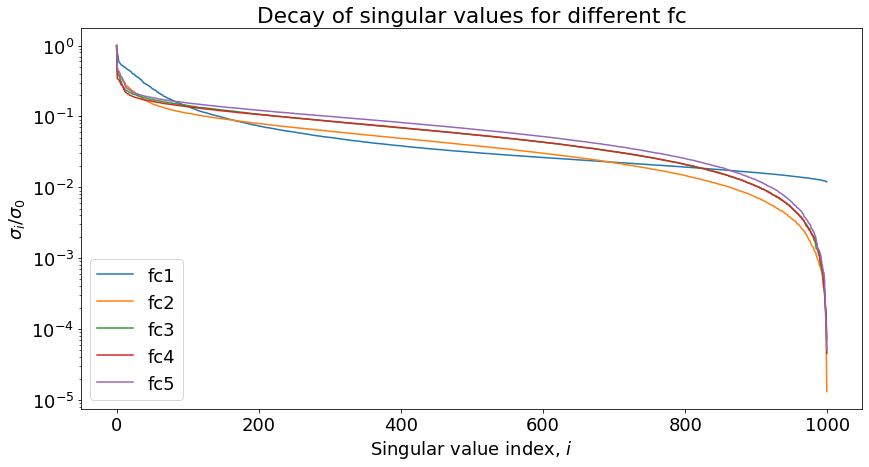

In [47]:
# Plotting
plt.figure(figsize=(14, 7))
plt.rcParams.update({'font.size': 18})
plt.plot(Sigma1/Sigma1[0], label = 'fc1')
plt.plot(Sigma2/Sigma2[0], label = 'fc2')
plt.plot(Sigma3/Sigma3[0], label = 'fc3')
plt.plot(Sigma4/Sigma4[0], label = 'fc4')
plt.plot(Sigma5/Sigma5[0], label = 'fc5')
#plt.plot(Sigma6, label = 'fc6') 
# I didn't plot fc6 because of incomparable number of singularvaues - 10 vs 1000 for others
plt.title('Decay of singular values for different fc')
plt.yscale('log')
#plt.xscale('log')
plt.legend(loc='best')
plt.ylabel(r"$\sigma_i / \sigma_0$")
plt.xlabel(r"Singular value index, $i$")
plt.show()

The decay of singular values is quite slow, fc_2 - fc_5 are close to $10^{-4}$ only with particulary all singular values. Lets have closer look on decay of singular values with numbers $1..200$ 

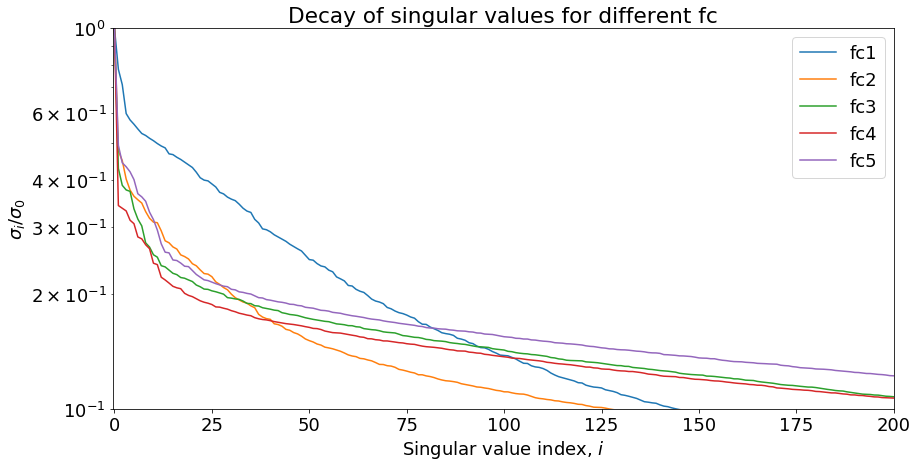

In [48]:
# Plotting more detailed part of graph - decay to 1 is at about N_sigma ~ 200 (in general)
plt.figure(figsize=(14, 7))
plt.rcParams.update({'font.size': 18})
plt.plot(Sigma1/Sigma1[0], label = 'fc1')
plt.plot(Sigma2/Sigma2[0], label = 'fc2')
plt.plot(Sigma3/Sigma3[0], label = 'fc3')
plt.plot(Sigma4/Sigma4[0], label = 'fc4')
plt.plot(Sigma5/Sigma5[0], label = 'fc5')
#plt.plot(Sigma6, label = 'fc6') 
# I didn't plot fc6 because of incomparable number of singularvaues - 10 vs 1000 for others
plt.title('Decay of singular values for different fc')
plt.yscale('log')
plt.xlim(-0.5,200)
plt.ylim(0.1,1)
#plt.xscale('log')
plt.legend(loc='best')
plt.ylabel(r"$\sigma_i / \sigma_0$")
plt.xlabel(r"Singular value index, $i$")
plt.show()

As I understand we shoul modify our class(__init__, forward) via SVD. Again, if I understand task correctly, we should perform SVD in layer $fc_{n}$ and get new "sliced" matrix with $\mathrm{rank}A_r = r, \dim A_r = 1000$, which is a product of $A_r = U_r{\Sigma}_r V_r^{T}$ (we slice just like [:, 0:r] etc). Dimension of $A_r$ is still 1000, because we storage all zeros that replace singular values. It is inefficient to storage such matrix - we will storage shorter matrices (at least until r = 1000) and compute $A_r$ again if nessesary. And this "nessesary" comes in forward.
At first we also supposed to test it with chosen value of $r$. I chose $r = 200$ at first, since it the approximate number of singular values (from the graph above) to get to the "plateau", where decay is extremely slow for approximately 600 singular values.

In [147]:
class My_net(nn.Module): # my Net class

#There was supposed to be additional function for SVD, but I couldn't finish it in time

    #def compress(model, f_U, f_S, f_Vt, r):     
        #U, Sigma , Vt = np.linalg.svd(model.weight.detach().numpy())
        #f_U = U[:, 0:r]
        #f_S = np.diag(Sigma[0:r])
        #f_Vt = Vt[0:r, :]       
        #return f_U, f_S, f_Vt
    
    
    def __init__(self, obj, r): # here we shoul put not only self, but obj (of class Net()), rank r
        super(My_net, self).__init__()
        self.fc1 = obj.fc1 # Do not have to do compression, it is initial step
        
        U, Sigma , Vt = np.linalg.svd(obj.fc2.weight.detach().numpy())
        self.fc2_U = U[:, 0:r]
        #self.fc2_Sigma = Sigma[:r]
        self.fc2_Sigma = np.diag(Sigma[0:r])
        self.fc2_Vt = Vt[0:r, :]
        self.fc2_new_bias=obj.fc2.bias # bias "update"

        U, Sigma , Vt = np.linalg.svd(obj.fc3.weight.detach().numpy())
        self.fc3_U = U[:, 0:r]
        self.fc3_Sigma = np.diag(Sigma[0:r])
        self.fc3_Vt = Vt[0:r, :]
        self.fc3_new_bias=obj.fc3.bias

        U, Sigma , Vt = np.linalg.svd(obj.fc4.weight.detach().numpy())
        self.fc4_U = U[:, 0:r]
        self.fc4_Sigma = np.diag(Sigma[0:r])
        self.fc4_Vt = Vt[0:r, :]
        self.fc4_new_bias=obj.fc4.bias
            
        U, Sigma , Vt = np.linalg.svd(obj.fc5.weight.detach().numpy())
        self.fc5_U = U[:, 0:r]
        self.fc5_Sigma = np.diag(Sigma[0:r])
        self.fc5_Vt = Vt[0:r, :]
        self.fc5_new_bias=obj.fc5.bias
        
        self.fc6 = obj.fc6
        self.ReLU = nn.ReLU() # Also do not have to do compression
        
    def forward(self, x):
        
        decomposed_x = nn.Linear(1000,1000)
        x = self.fc1(x.view(-1, 3 * 32*32))
        x = self.ReLU(x) # from fc2 we starting to "compress" our matrices alltogether with right number of singular values
 
        decomposed_x.weight.data = torch.tensor(np.dot(np.dot(self.fc2_U, self.fc2_Sigma), self.fc2_Vt)) 
        decomposed_x.bias = self.fc2_new_bias
        x = decomposed_x(x)
        x = self.ReLU(x)
        
        decomposed_x.weight.data = torch.tensor(np.dot(np.dot(self.fc3_U, self.fc3_Sigma), self.fc3_Vt)) 
        decomposed_x.bias = self.fc3_new_bias
        x = decomposed_x(x)
        x = self.ReLU(x)
        
        decomposed_x.weight.data = torch.tensor(np.dot(np.dot(self.fc4_U, self.fc4_Sigma), self.fc4_Vt)) 
        decomposed_x.bias = self.fc4_new_bias
        x = decomposed_x(x)
        x = self.ReLU(x)
        
        decomposed_x.weight.data = torch.tensor(np.dot(np.dot(self.fc5_U, self.fc5_Sigma), self.fc5_Vt)) 
        decomposed_x.bias = self.fc5_new_bias
        x = decomposed_x(x)
        
        x = self.ReLU(x)
        x = self.fc6(x)
        return F.log_Sigmaoftmax(x, dim=1)

In [148]:
my_model = My_Net(obj = Net(), r = 100)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

for epoch in range(1, epochs + 1):
    train(model,  train_loader, optimizer, epoch)
    test(model, test_loader)

Train Epoch: 1 [0/50000 (0%)]	Loss: 0.109232
Train Epoch: 1 [5000/50000 (10%)]	Loss: 0.036663
Train Epoch: 1 [10000/50000 (20%)]	Loss: 0.002105
Train Epoch: 1 [15000/50000 (30%)]	Loss: 0.119626
Train Epoch: 1 [20000/50000 (40%)]	Loss: 0.032863
Train Epoch: 1 [25000/50000 (50%)]	Loss: 0.027953
Train Epoch: 1 [30000/50000 (60%)]	Loss: 0.024247
Train Epoch: 1 [35000/50000 (70%)]	Loss: 0.524527
Train Epoch: 1 [40000/50000 (80%)]	Loss: 0.094131
Train Epoch: 1 [45000/50000 (90%)]	Loss: 0.036303

Test set: Average loss: 6.9904, Accuracy: 5505/10000 (55%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 0.108497
Train Epoch: 2 [5000/50000 (10%)]	Loss: 0.051663
Train Epoch: 2 [10000/50000 (20%)]	Loss: 0.111692
Train Epoch: 2 [15000/50000 (30%)]	Loss: 0.026992
Train Epoch: 2 [20000/50000 (40%)]	Loss: 0.096049
Train Epoch: 2 [25000/50000 (50%)]	Loss: 0.053176
Train Epoch: 2 [30000/50000 (60%)]	Loss: 0.047662
Train Epoch: 2 [35000/50000 (70%)]	Loss: 0.190075
Train Epoch: 2 [40000/50000 (80%)]	Loss: 0.097125
T

I modified a bit functions for training and testing, since we don't want to see whole profile and also want to get accuracy.

In [111]:
def My_train(model, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output, target)
        loss.backward()
        optimizer.step()


def My_test(model, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
#             data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True) # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
    test_loss /= len(test_loader.dataset)
    return correct

In [145]:
import timeit

R = [(i+1)*10 for i in range(10)]
correct = []
time []
for r in R:
    
    my_model = My_Net(obj = Net(), r = r)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
    for epoch in range(1, epochs + 1): # for 7 epochs (takes about an hour to compute all)
        My_train(model,  train_loader, optimizer, epoch)
        a = My_test(model, test_loader)
    correct.append(a)
    time.append(t)

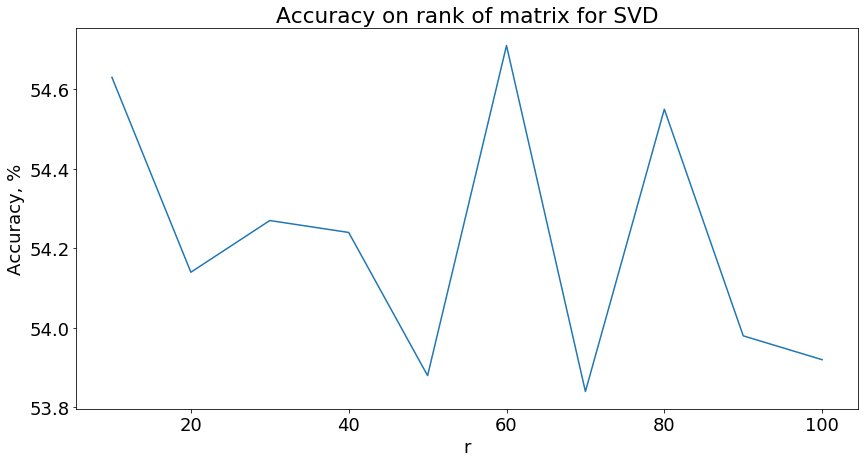

In [158]:
Acc_percent = [correct[i]/10000*100 for i in range(len(correct))]
plt.figure(figsize=(14, 7))
plt.rcParams.update({'font.size': 18})
plt.plot(R,Acc_percent)
plt.title('Accuracy on rank of matrix for SVD')
plt.ylabel('Accuracy, %')
plt.xlabel('r')
plt.show()

Actually I expected different behaviour - instead of this strange oscillations, it should be more or less monotonic (accuracy should increase with rank, because we are capturing more and more singular values in this case). But also I want to mention overall accuracy is still very high, maybe with smaller step (and maybe a cluster for computation), result will be smoother and more informative. By the way, accuracy of naive class Net() is still a bit lower (usually 53-54, not 55), so we won a percent, which in my opinion is still rather good. 
<br>
These sources I found useful (more for understanding the compression idea than an implementation):
- https://rpubs.com/himank369123/476208
- https://medium.com/@rameshputalapattu/jupyter-python-image-compression-and-svd-an-interactive-exploration-703c953e44f6
- https://cuicaihao.com/2017/01/03/how-to-understand-svd-in-image-compressing%EF%BC%9F/

<br>
Implementation hints are all rather insignificant since the idea and "to-do list" is clear (for example, "how to handle this error", "How to use SVD in classes for pytorch properly", "Why do we need bias info" or "How to extract this matrix") and were taken from StackOverflow and other forums. And also from manual, of course.

In [164]:
import timeit
def f(r):
    my_model = My_Net(obj = Net(), r = r)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
    for epoch in range(1, 1 + 1):
        My_train(model,  train_loader, optimizer, epoch)
        a = My_test(model, test_loader)
    
R = [(i+1)*10 for i in range(10)]
correct1 = []
time1 = []
for r in R:
    t = %timeit -o f(r) 
    #t = timeit.timeit('f(r)')
    time1.append(t)

1min 10s ± 253 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1min 10s ± 501 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1min 41s ± 29.4 s per loop (mean ± std. dev. of 7 runs, 1 loop each)
2min 8s ± 1.29 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


KeyboardInterrupt: 

Own profiler

In [177]:
from time import time
def f(r):
    my_model = My_Net(obj = Net(), r = r)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    for epoch in range(1, 1 + 2): # trying with 2 epoch instead of 7, should be enough for rough time estimation
        My_train(model,  train_loader, optimizer, epoch)
        a = My_test(model, test_loader)
# %timeit works for soooo long, so I organaized my own time profiler     
R = [(i+1)*10 for i in range(10)]
time2 = []
for r in R:
    current_time = time() 
    f(r)
    time2.append(time()-current_time)


KeyboardInterrupt: 

In [ ]:
plt.plot(R,time2)

As it was predicted, time consumption is rising!

# Problem 5 (Bonus)

1. The norm is called absolute if $\|x\|=\| \lvert x \lvert \|$ holds for any vector $x$, where $x=(x_1,\dots,x_n)^T$ and $\lvert x \lvert = (\lvert x_1 \lvert,\dots, \lvert x_n \lvert)^T$. Give an example of a norm which is not absolute.

## Solution

First thing I did in this task - googled for books and papers. As a result I found good materials :
- Good old paper for underctanding the consept of absolute and monotonic (another related class) : https://link.springer.com/content/pdf/10.1007/BF01386026.pdf 
- Paper even older with nice example of non-absolut norm : https://www.cs.cornell.edu/gries/Papers/Characterizations_of_Certain_Classes_of_Norms.pdf

Lets consider $x = (x_1, x_2) \in R^2$ and let index $_M$ stands for "Mixed":

$
\begin{equation*}
 \|x\|_M = 
 \begin{cases}
   \|x\|_{\infty} = max(|x_1|, |x_2|), &\text{$x_1 \geq 0$}\\
   \|x\|_{2}  = \sqrt{x_1^2+x_2^2},&\text{$x_1 \leq 0$}
 \end{cases}
\end{equation*}
$

Why it is even a norm? For me it is kind of obvious, because all properties of the norm will be fullfiled because of "mixed" nature of this norm (if $x_1 \geq 0$ we will get this properties from $\|x\|_{\infty}$, and if $x_1 \leq 0$ - from $\|x\|_{2}$). But still we can show this transition, for example, for one of the properties :
<br>
$
\begin{equation*}
 \|\alpha x\|_M = 
 \begin{cases}
   \|\alpha x\|_{\infty} = max(|\alpha x_1|, |\alpha x_2|) = |\alpha|max(|x_1|, |x_2|) = |\alpha |\|x\|_{\infty}, &\text{$x_1 \geq 0$}\\
   \|\alpha x\|_{2}  = \sqrt{(\alpha x_1)^2+(\alpha x_2)^2} = |\alpha|\sqrt{x_1^2+x_2^2} = |\alpha |\|x\|_{2},&\text{$x_1 \leq 0$}
 \end{cases}
\end{equation*}
$
<br>
Others will be exactly similar.
<br>
<br>
But this norm is not absolute - since $\| \lvert x \lvert \|$ holds for any vector $x$, where $x=(x_1,\dots,x_n)^T$ and $\lvert x \lvert = (\lvert x_1 \lvert,\dots, \lvert x_n \lvert)^T$, we will not have an option $x_1 \leq 0$ and it will basically norm $\infty$.
<br>
Lets prove it and draw some norm balls (code is taken from the very first seminar):

Text(0.5, 1.0, 'Unit disk in the mixed norm')

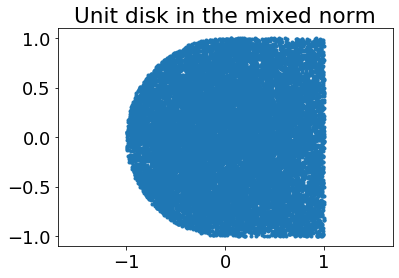

In [138]:
p1 = np.inf # Which norm do we use first
p2 = 2
M = 40000 # Number of sampling points
a = np.random.randn(M, 2)
b = []
for i in range(M):
    if (np.linalg.norm(a[i, :], p1) <= 1) & (a[i,0] >= 0):
        b.append(a[i, :])
    if (np.linalg.norm(a[i, :], p2) <= 1) & (a[i,0] < 0):
        b.append(a[i, :])
b = np.array(b)
plt.plot(b[:, 0], b[:, 1], '.')
plt.axis('equal')
plt.title('Unit disk in the mixed norm')

Text(0.5, 1.0, "Unit disk in the mixed 'absolute' norm")

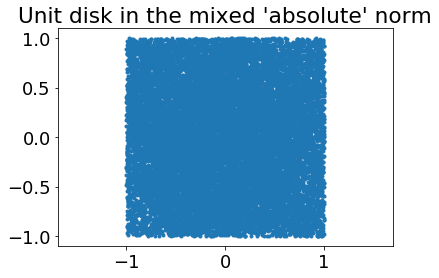

In [140]:
b = []
for i in range(M):
    if (np.linalg.norm(abs(a[i, :]), p1) <= 1) & (abs(a[i,0]) >= 0):
        b.append(a[i, :])
    if (np.linalg.norm(abs(a[i, :]), p2) <= 1) & (abs(a[i,0]) < 0):
        b.append(a[i, :])
b = np.array(b)
plt.plot(b[:, 0], b[:, 1], '.')
plt.axis('equal')
plt.title('Unit disk in the mixed \'absolute\' norm')

#### So we proved that this norm is not absolute. Also we can construct many similar norms. I assume norms with assimetric norm balls (like ellips or similar) will be non-absolute for the same reason, as norm from my example.

2. Write a function ```ranks_HOSVD(A, eps)```
that calculates Tucker ranks of a d-dimensional tensor $A$ using High-Order SVD (HOSVD) algorithm, where ```eps``` is the relative accuracy in the Frobenius norm between the approximated and the initial tensors. Details can be found [here](http://ca.sandia.gov/~tgkolda/pubs/pubfiles/TensorReview.pdf) on Figure 4.3.
```python
def ranks_HOSVD(A, eps):
      return r #r should be a tuple of ranks r = (r1, r2, ..., rd)
```

## No solution :(